In [386]:
# Importing the necessary libraries
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE, LocallyLinearEmbedding, MDS
from sklearn.ensemble import RandomForestClassifier
from tqdm import tqdm
from matplotlib import pyplot as plt
from sklearn.cluster import KMeans

### Importing our sign mnist data

In [387]:
import warnings
warnings.filterwarnings('ignore')

- The sign dataset contains hands gestures for representing different alphabets from A-Z but they do not include J and Z because they require movement of hands to identify them

In [388]:
test = pd.read_csv('sign_mnist_test.csv')
train = pd.read_csv('sign_mnist_train.csv')

- There are 27455 rows each representing different hand gestures with labels in the first column for the respective alphabet

In [389]:
train.shape

(27455, 785)

In [390]:
train.head(5)

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,3,107,118,127,134,139,143,146,150,153,...,207,207,207,207,206,206,206,204,203,202
1,6,155,157,156,156,156,157,156,158,158,...,69,149,128,87,94,163,175,103,135,149
2,2,187,188,188,187,187,186,187,188,187,...,202,201,200,199,198,199,198,195,194,195
3,2,211,211,212,212,211,210,211,210,210,...,235,234,233,231,230,226,225,222,229,163
4,13,164,167,170,172,176,179,180,184,185,...,92,105,105,108,133,163,157,163,164,179


In [391]:
train["label"].unique()

array([ 3,  6,  2, 13, 16,  8, 22, 18, 10, 20, 17, 19, 21, 23, 24,  1, 12,
       11, 15,  4,  0,  5,  7, 14])

In [392]:
classes = {0: "A", 1: "B", 2: "C", 3: "D", 4: "E", 5: "F", 6: "G", 7: "H", 8: "I", 9: "J", 10: "K", 11: "L", 12: "M", 13: "N", 14: "O", 15: "P", 16: "Q", 17: "R", 18: "S", 19: "T", 20: "U", 21: "V", 22: "W", 23: "X", 24: "Y", 25: "Z"}


In [393]:
train, val = train_test_split(train, test_size=4000, random_state=42, stratify=train['label'])

In [394]:
train["label"].value_counts()

17    1105
16    1093
11    1060
22    1047
5     1029
18    1024
14    1022
3     1022
19    1013
23     994
8      993
20     992
13     983
2      977
0      962
24     955
10     952
6      931
15     930
21     924
12     901
7      865
1      863
4      818
Name: label, dtype: int64

### Scaling the pixels and generating training,testing and validation sets

In [395]:
x_train, y_train = train.drop('label', axis=1) / 255, train['label']
x_val, y_val = val.drop('label', axis=1) / 255, val['label']
x_test, y_test = test.drop('label', axis=1) / 255, test['label']

In [396]:
y_test.head()

0     6
1     5
2    10
3     0
4     3
Name: label, dtype: int64

Applying PCA to the training portion of the dataset to preserve atleast 95% of the variance.

In [397]:
pca = PCA(n_components=0.95) # For 95% of the total variance to remain in our train dataset
x_train_pca = pca.fit_transform(x_train)

In [398]:
pca.n_components_

113

- We need 113 components to preserve our 95% variance out of the 784 features

In [399]:
sum(pca.explained_variance_ratio_)

0.9501181574689692

Training a Random Forest classifier on the reduced dataset. 



In [400]:
rf_clf = RandomForestClassifier(n_estimators=100,oob_score=True, n_jobs=-1, random_state=1)

- Without PCA

In [401]:
%%time
rf_clf.fit(x_train,y_train)

CPU times: user 35.2 s, sys: 508 ms, total: 35.8 s
Wall time: 6.56 s


RandomForestClassifier(n_jobs=-1, oob_score=True, random_state=1)

In [402]:
rf_clf.score(x_val, y_val)

0.997

In [403]:
rf_clf.score(x_test, y_test)

0.8035415504740658

- With PCA

In [404]:
%%time
rf_clf.fit(x_train_pca, y_train)

CPU times: user 23.2 s, sys: 119 ms, total: 23.3 s
Wall time: 3.55 s


RandomForestClassifier(n_jobs=-1, oob_score=True, random_state=1)

- For this dataset, after doing PCA the speed of fitting the random forest classifier has improved. As we can see previously it took 6.56s but now it took only 3.55 seconds, because of the reduction in the dimensionality.

In [405]:
x_val_pca = pca.transform(x_val)
rf_clf.score(x_val_pca, y_val)

1.0

In [406]:
x_test_pca = pca.transform(x_test)
rf_clf.score(x_test_pca, y_test)

0.8008923591745678

- The accuracy on test set pca is 80.008%, which is quite good. This accuracy is comparable when we evaluated the model without PCA as then we were also getting 80.3 percent.

In [262]:
train_score = []
val_score = []
oob_score = []
n_est = [i+1 for i in range(100)]

for est in tqdm(n_est):
    rf_clf = RandomForestClassifier(n_estimators=est, oob_score=True, n_jobs=-1, random_state=420)
    rf_clf.fit(x_train_pca, y_train)
    train_score.append(rf_clf.score(x_train_pca, y_train))
    val_score.append(rf_clf.score(x_val_pca, y_val))
    oob_score.append(rf_clf.oob_score_)

100%|█████████████████████████████████████████| 100/100 [03:12<00:00,  1.93s/it]


#### Out of Bag Score vs Number of Estimators. Just for checking till which estimators we are getting the perfect score

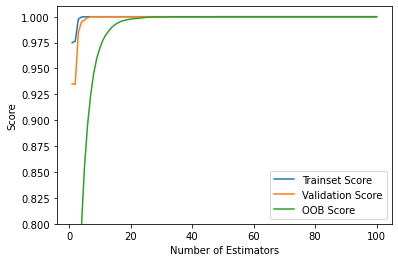

In [263]:
plt.plot(n_est, train_score, label='Trainset Score')
plt.plot(n_est, val_score, label='Validation Score')
plt.plot(n_est, oob_score, label='OOB Score')
plt.xlabel('Number of Estimators')
plt.ylabel('Score')
plt.ylim(0.8, 1.01)
plt.legend()
plt.show()

Plotting 10 random images in the original form (without PCA) and then plotting them after you kept 95% of variance using PCA

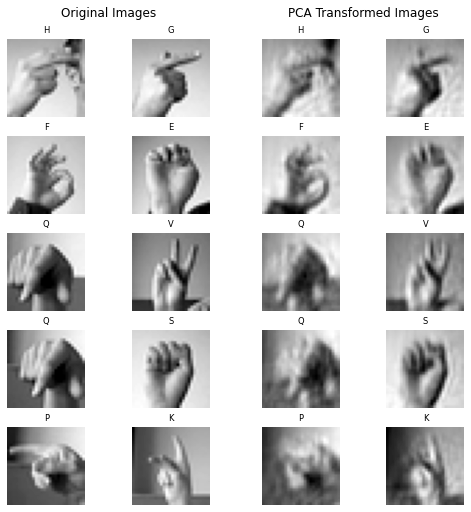

In [407]:
random_img_indices = np.random.randint(len(x_train), size=10)

fig = plt.figure(figsize=(7,7), constrained_layout=True)

subfigs = fig.subfigures(1, 2)

subfig = subfigs[0]
subfig.suptitle(f'Original Images')
axs = subfig.subplots(5, 2)
for innerind, ax in enumerate(axs.flat):
    ax.set_title(classes[y_train.iloc[random_img_indices[innerind]]], fontsize='small')
    ax.imshow(x_train.iloc[random_img_indices[innerind]].values.reshape(28,28), cmap="gray")
    ax.set_axis_off()

subfig = subfigs[1]
subfig.suptitle(f'PCA Transformed Images')
axs = subfig.subplots(5, 2)
for innerind, ax in enumerate(axs.flat):
    ax.set_title(classes[y_train.iloc[random_img_indices[innerind]]], fontsize='small')
    x_train_inv = pca.inverse_transform(x_train_pca[random_img_indices[innerind]])
    ax.imshow(x_train_inv.reshape(28,28), cmap="gray")
    ax.set_axis_off()

plt.show()

- We can clearly see that after doing PCA the images are blurred but recognizable because of the information loss. Though 95% of variance is still being preserved

 How much of the variance is explained with the first two principal components?
 

In [215]:
print(f'Explained variance:       {pca.explained_variance_[:2]}')
print(f'Explained variance ratio: {pca.explained_variance_ratio_[:2]}')
print(f'Total explained variance ratio: {sum(pca.explained_variance_ratio_[:2])}')

Explained variance:       [8.17113318 2.53208533]
Explained variance ratio: [0.31099644 0.09637213]
Total explained variance ratio: 0.40736856669906285


- The amount of varaince explained by the first two principal components is 40.7%

 Using PCA to reduce dimensionality to only 2 dimensions. Plotting 1000 random images from the trainingset in the 2D space spanned by the first two principal components. Using a scatterplot with 10 differentcolors to represent each image’s target class. Repeating the process and creating the same type of plotsfor t-SNE, LLE and MDS

In [216]:
indices = np.random.randint(len(x_train), size=1000) # For 1000 random images

In [217]:
def plot(x, y, indices, title):
    fig = plt.figure(figsize=(8,8))
    scatter=plt.scatter(x[indices][:,0], x[indices][:,1], c=y.iloc[indices], alpha=0.4)
    plt.title(title)
    plt.xlabel('1st Principal Component')
    plt.ylabel('2nd Principal Component')

    legend=plt.legend(*scatter.legend_elements(num=None), )
    plt.tight_layout()
    plt.show()

1000


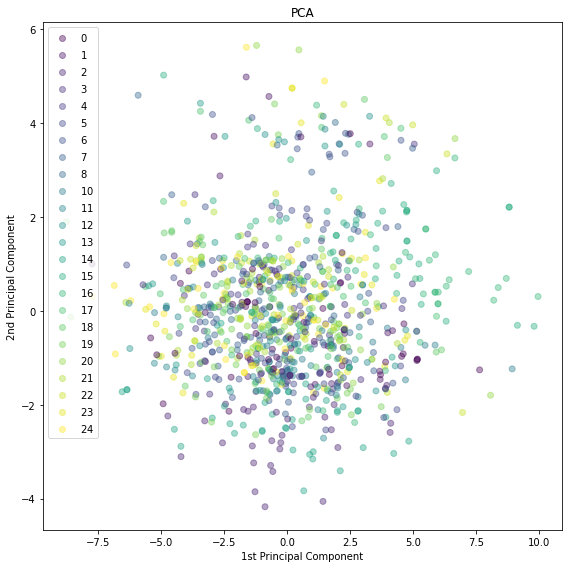

In [218]:
pca2d = PCA(n_components=2)
x_train_2d = pca2d.fit_transform(x_train)
print(len(x_train_2d[indices][:,1]))

plot(x_train_2d, y_train, indices, 'PCA')

## Trying to Visualizing it in 3D

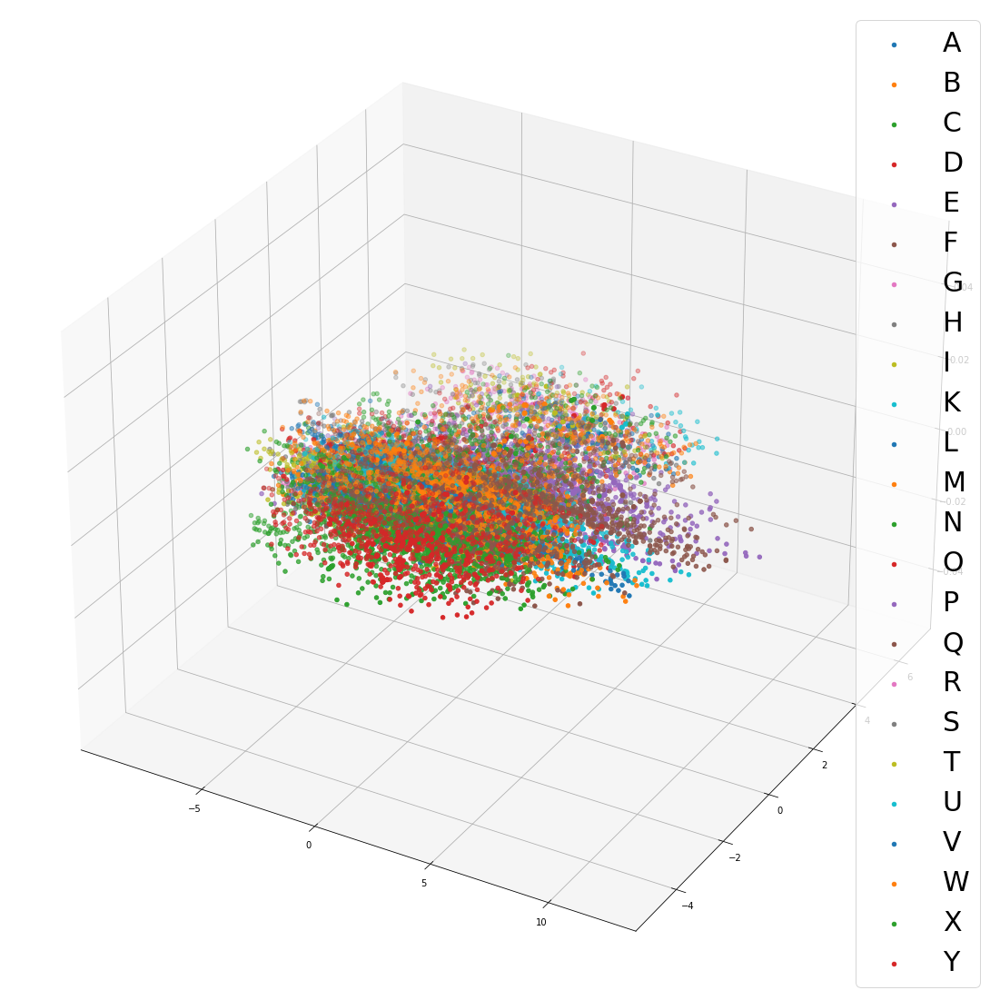

In [384]:
fig = plt.figure(figsize=(20,20))
axs = fig.add_subplot(projection='3d')
for i in np.unique(y_train):
    axs = plt.gca()
    idxs = np.where(y_train==i)
    X_2d = x_train_2d [idxs]
    axs.scatter(X_2d[:,0],X_2d[:,1],label=list(classes.values())[i])
axs.legend(fontsize="30")
plt.show()

- This two dimensional PCA plot is not able to categorize our data well, because the data is too complex and has large amount of labels which look quite similar, due to which it is not being able to project the data from a high dimension into a lower dimension space well enough.

- There is too much overlap and dispersion.We  could have tried to increase the dimensions of the PCA plot in order to have the maximum variance, as with 2 dimensions only 40% of the variance is preserved, but it will become extremely difficult to interpret them as the complexity of the plot will increase.


### TSNE 

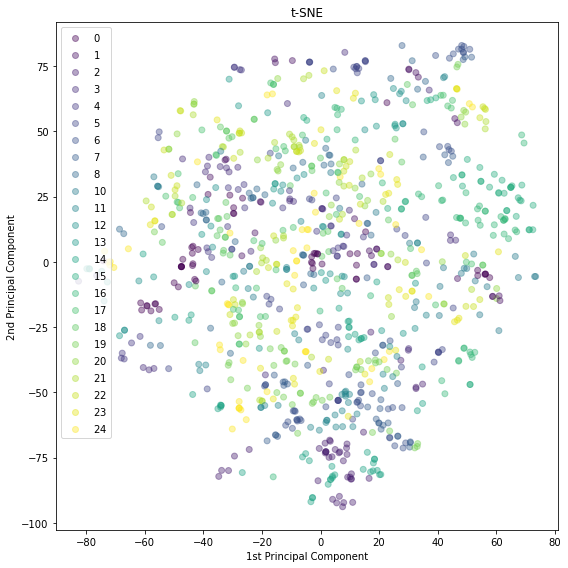

In [219]:
tsne = TSNE(n_components=2,perplexity=200, n_jobs=-1)
x_train_tsne = tsne.fit_transform(x_train)

plot(x_train_tsne, y_train, indices, 't-SNE')

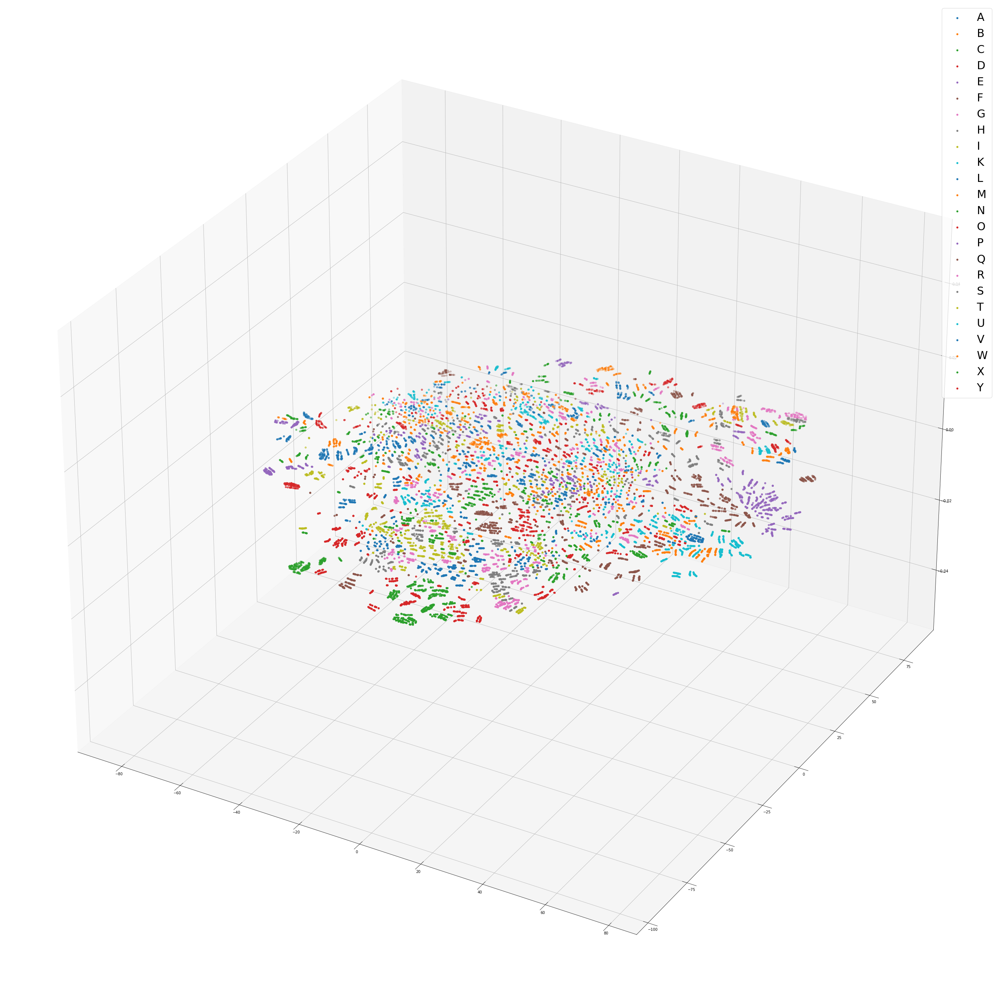

In [234]:
fig = plt.figure(figsize=(50,50))
axs = fig.add_subplot(projection='3d')
for i in np.unique(y_train):
    axs = plt.gca()
    idxs = np.where(y_train==i)
    X_2d = x_train_tsne[idxs]
    axs.scatter(X_2d[:,0],X_2d[:,1],label=list(classes.values())[i])
axs.legend(fontsize="30")
plt.show()

- TSNE performs a little better than PCA but not great enough to visualize the data into different categories as interpreted by our original dataset. Local Clusters can be seen which are scattered all around for all the points. We are only plotting for 2 components here, it is possible if we plot for more than 2 components the model will be able to capture data with more variance and the plot will seem more feasible by seperating different categories and interpreting the original labels seperately. But again, it will be too difficult to visualize with more components and interpret them.

### LLE

In [232]:
lle = LocallyLinearEmbedding(n_components=2, n_jobs=-2)
x_train_lle_6 = lle.fit_transform(x_train)

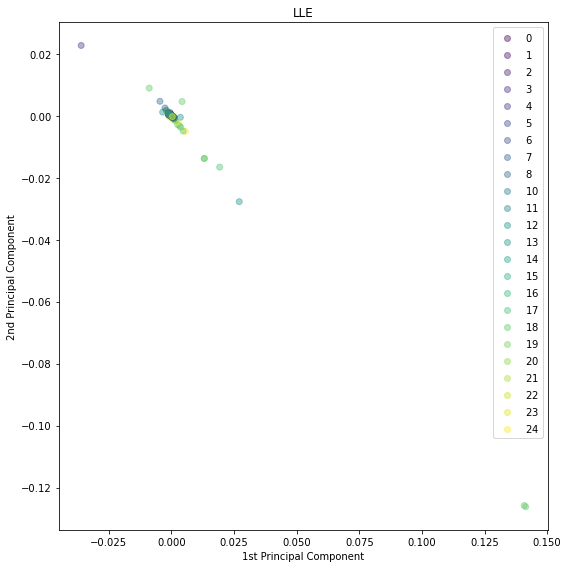

In [233]:
plot(x_train_lle_6, y_train, indices, 'LLE')

In [379]:
lle = LocallyLinearEmbedding(n_components=2,n_neighbors=10, n_jobs=-2)
x_train_lle_6 = lle.fit_transform(x_train)

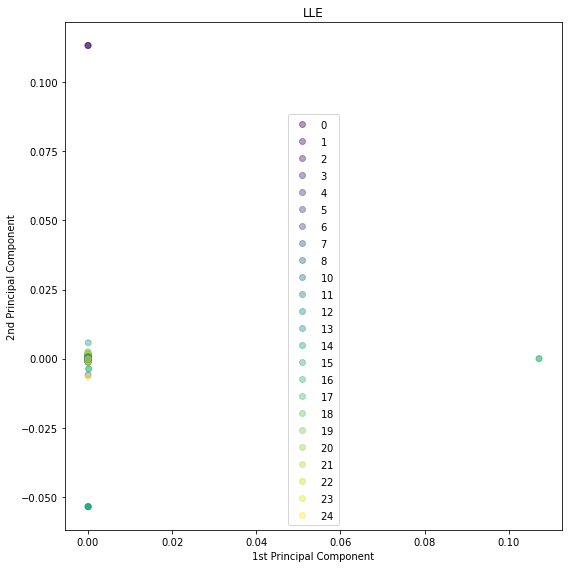

In [380]:
plot(x_train_lle_6, y_train, indices, 'LLE')

In [381]:
lle = LocallyLinearEmbedding(n_components=2,n_neighbors=20, n_jobs=-2)
x_train_lle_6 = lle.fit_transform(x_train)


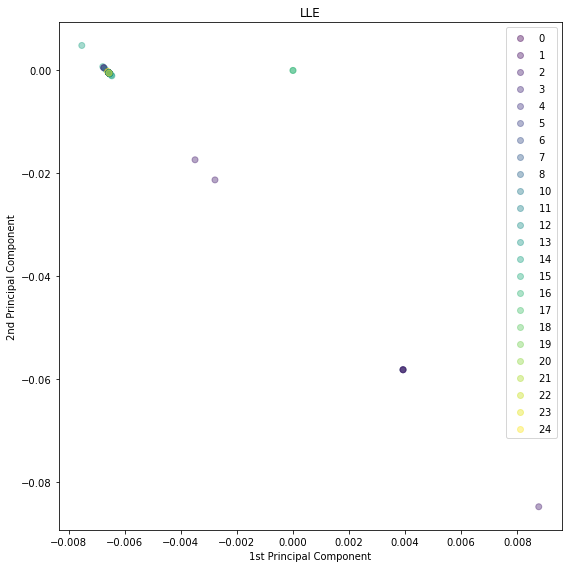

In [382]:
plot(x_train_lle_6, y_train, indices, 'LLE')

- It becomes extremely difficult to visulalize the data from a higher dimensional space into lower dimensional space using LLE.
- One thing to notice here is that default neighbours in LLE is 5 but for each class we have around 1000 rows, which will make LLE a computationaly expensive algorithm as we need to keep n_neighbours as 1000

### MDS

In [235]:
mds = MDS(n_components=2, n_init=4, max_iter=100, n_jobs=-2, random_state=10)
x_train_mds = mds.fit_transform(x_train[:3000])

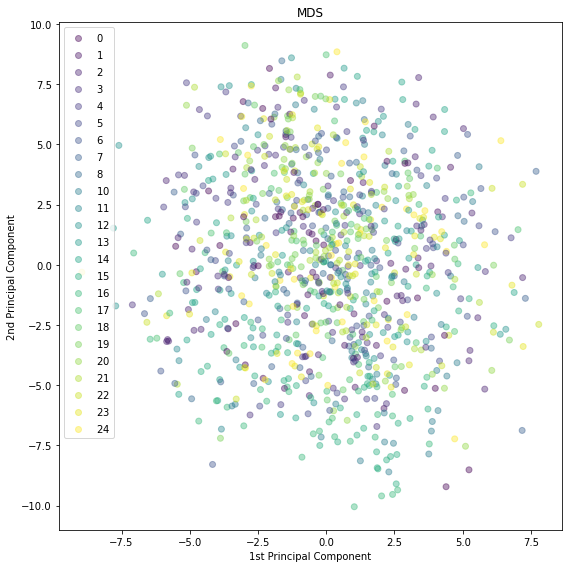

In [236]:
plot(x_train_mds, y_train, range(1000), 'MDS')

- With MDS also too its becoming really difficult to visulaize the points

 Which of the visualizations do we prefer and why? 
 

- From all the plots and the reasons mentioned above. None of the plots is doing well because we cannot see the seperation of labels in the plots cleary as in the original dataset. 
- However if I have to choose the best one out of these it will be TSNE because at least it shows some sense of seperation of classes. However, in that also the points are widely distributed and shows a sense of overlapping labels.
- This shows that the all of the dim-reductions techniques above are not able to project well the data into the lower dimensional space. There can be number of reasons like plotting for only 2 components which is not enabling us to capture the whole variance or the complex structure of the underlying data.Thus, we should try using other dimensional techniques or Deep Learning for better results so that it can capture the complex relationships between the datapoints.

- This is also due to the fact that in the images there is very little variation to differentiate among the labels. 

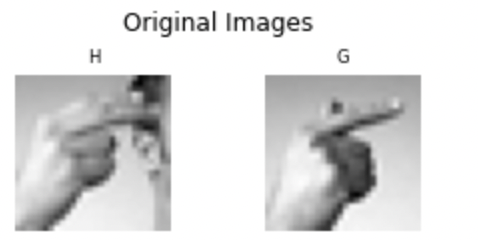
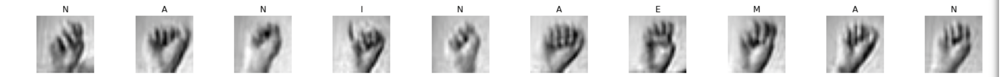

- As you can see the images are really identical and complex to be seperated, because there is only a difference of finger and palm spatial orientation to differ between the images


 Taking 10000 samples of the training portion of sign MNIST dataset and cluster the images using K-Means. To speed up the algorithm, using PCA to reduce the dimensionality of the dataset. Ensuring thatyou have a good number of clusters using one of the techniques.



- I am trying the number of clusters to range from 20-35 first to see how well it is categorizing the data, and to select the suitable number of clusters using the metrics of silhoutte score and inertia

In [346]:
random_10000 = np.random.randint(len(x_train), size=10000) # Selecting 10,000 images

In [347]:
x_rand = x_train.iloc[random_10000]
y_rand = y_train.iloc[random_10000]

In [348]:
pca = PCA(n_components=0.95)
x_rand_pca = pca.fit_transform(x_rand)

##### Chooosing the right number of clusters  for K means. Here I am iterating from 20 clusters to 35 clusters to see their inertia behaviour and silhoutte score

In [350]:
from sklearn.metrics import silhouette_score, silhouette_samples
k = [i for i in range(20,35)]
kmeans_models = [KMeans(n_clusters=i,random_state=4200).fit(x_rand_pca) for i in k]
inertias = [km.inertia_ for km in kmeans_models]
silhouette_scores = [silhouette_score(x_rand_pca, km.labels_) for km in kmeans_models]
silhouette_score_per_instance = [silhouette_samples(x_rand_pca, km.labels_) for km in kmeans_models]

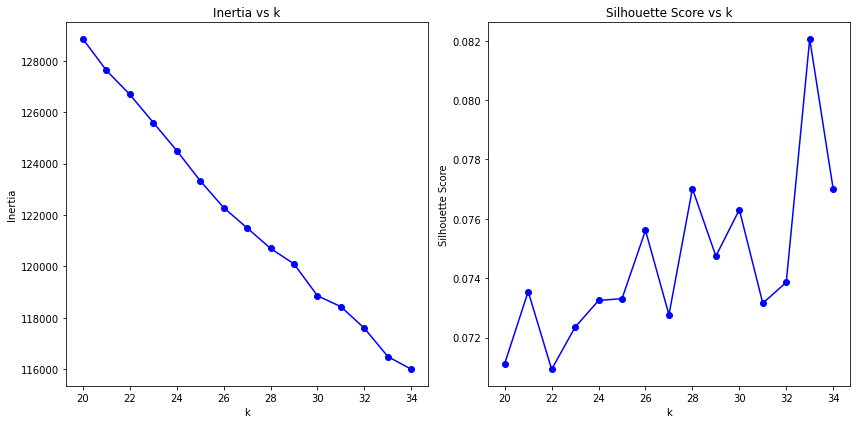

In [351]:
fig = plt.figure(figsize=(12,6))

plt.subplot(121)
plt.plot(k, inertias, 'bo-')
plt.title(f'Inertia vs k')
plt.xlabel('k')
plt.ylabel('Inertia')

plt.subplot(122)
plt.plot(k, silhouette_scores, 'bo-')
plt.title(f'Silhouette Score vs k')
plt.xlabel('k')
plt.ylabel('Silhouette Score')
plt.tight_layout()
plt.show()

- From the above two graphs it seems that the visualization of silhoutte score makes sense and we get the highest silhoutte score for k=33.

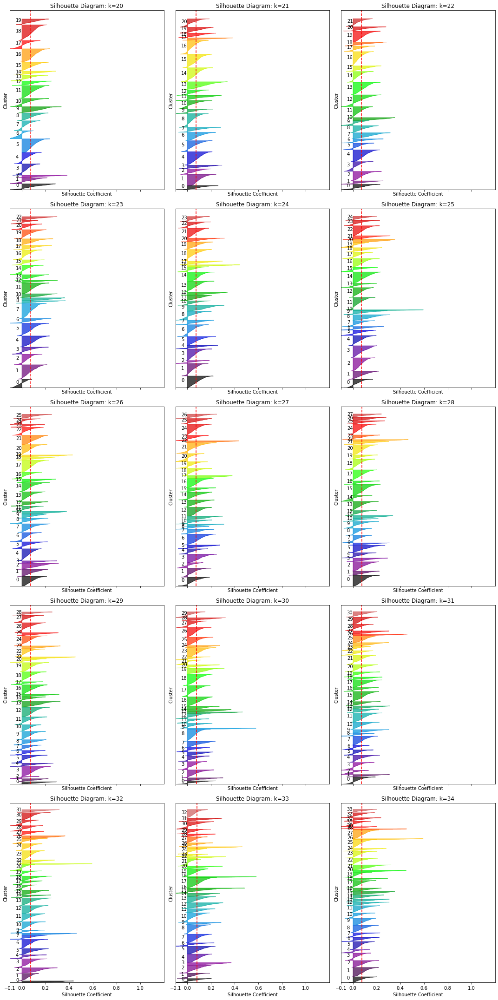

In [352]:
from matplotlib import cm as cm
fig, axs = plt.subplots(5, 3, figsize=(15,30), sharex=True, sharey=True, squeeze=True)
ax = axs.reshape(-1)

for i in range(len(k)):
    ax[i].set_xlim([-0.1, 1.2])
    ax[i].set_ylim([0, len(x_rand_pca) + (k[i] + 1) * 20])

    silhouette_avg = silhouette_scores[i]

    y_lower = 10
    for j in range(k[i]):
        ith_cluster_silhouette_values = np.asarray(silhouette_score_per_instance[i])[kmeans_models[i].labels_ == j]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(j) / k[i])
        ax[i].fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        ax[i].text(-0.05, y_lower + 0.5 * size_cluster_i, str(j))

        y_lower = y_upper + 10

    ax[i].set_title(f"Silhouette Diagram: k={k[i]}")
    ax[i].set_xlabel("Silhouette Coefficient")
    ax[i].set_ylabel("Cluster")

    ax[i].axvline(x=silhouette_avg, color="red", linestyle="--")

    ax[i].set_yticks([])
    ax[i].set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

plt.tight_layout()
plt.show()

- After visualizing the silhouetee graphs for every clusters from k=20 to k=34. The graph for k=33 is satisfying
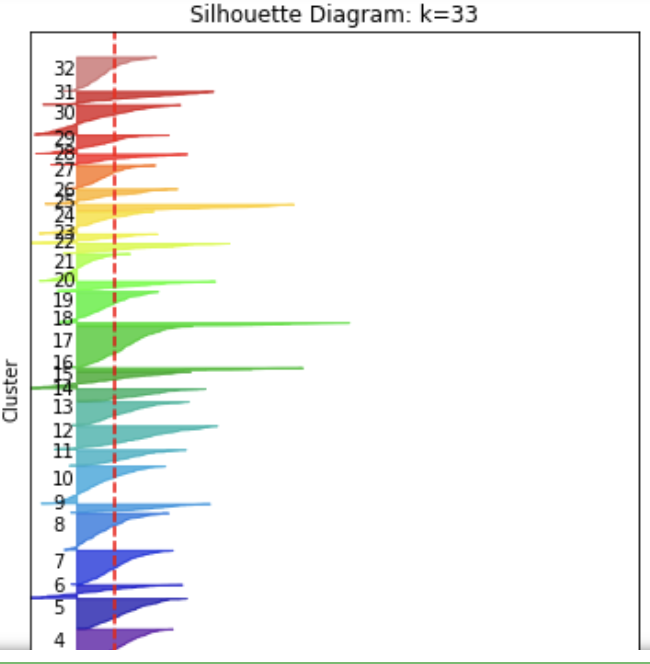
- The red line shows the silhoutte score for k=33 and and all the other clusters passes this dashed line, Hence k=33 is a good choice for K means clustering

### Question-8 Visualize the clusters (you can show only a subset of images): do you see similar clothing items in each cluster?

In [353]:
kmeans = kmeans_models[-2] # for selecting the model with 33 clusters
x_val_pca = pca.transform(x_val)
y_val_pred = kmeans.predict(x_val_pca)

In [367]:
centers=kmeans.cluster_centers_

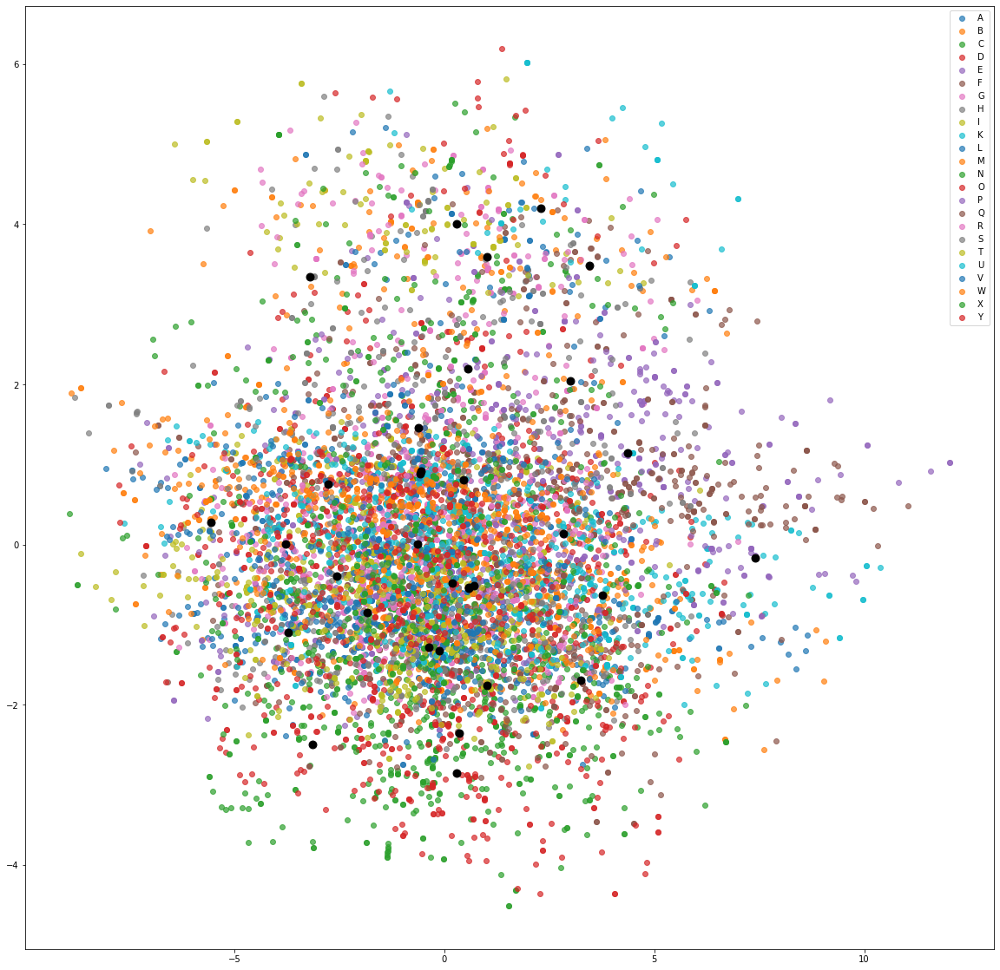

In [378]:
plt.figure(figsize=(20,20))
for i in np.unique(y_rand):
    idxs = np.where(i==y_rand)
    X = x_rand_pca[idxs]
    plt.scatter(X[:,0],X[:,1],label=list(classes.values())[i],alpha=0.7)
plt.scatter(centers[:,0],centers[:,1],s = 80, color = 'k')
plt.legend()

#### Subset of Images for each cluster

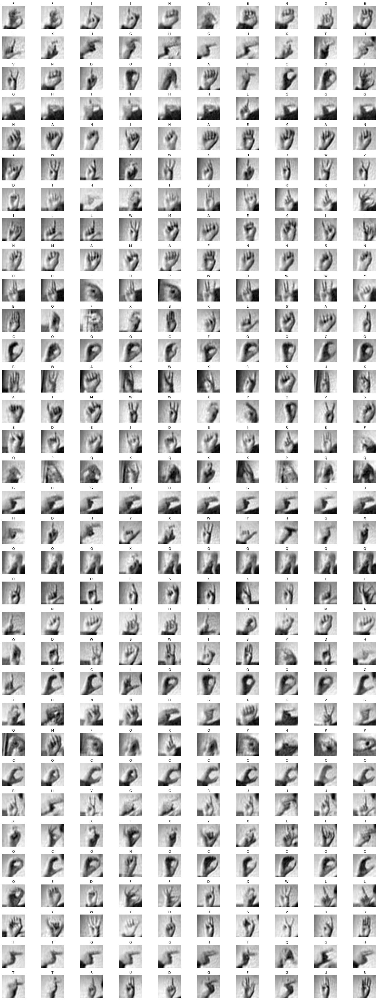

In [355]:
fig = plt.figure(figsize=(20,50))

for i in range(33):
    i_labelled_imgs = pca.inverse_transform(x_val_pca[y_val_pred == i][:10])
    true_labels = y_val[y_val_pred == i][:10]

    for j in range(10):
        plt.subplot(33,10, i*10 + j + 1)
        plt.imshow(i_labelled_imgs[j].reshape(28,28), cmap='gray')
        plt.title(classes[true_labels.iloc[j]])
        plt.axis('off')

plt.tight_layout()
plt.show()

- The below images are from the above clusters to have a better understanding
- We definitely see an overlap between the subset of images, the maximum silhoutte score which we are getting is also 0.082 which is really less. These hand gestures represents alphabets and have many  small variations in between the fingers which is making difficult for K means to perfectly categorize the same images into similar clusters. As you can see below that there is only a difference of thumb in categorizing A, M and E. So this is creating huge overlap between the different classes and making it difficult for K means to account for these small variations, due to that which it is grouping them into similar groups. It would be good if we use deep learning models such as CNN to account for this small variations in the dataset
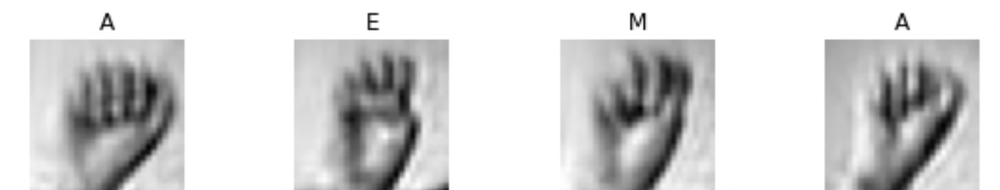
- But there are some classes such as c which forms a good cluster with little discrepancies as it is formed by half curved palm.

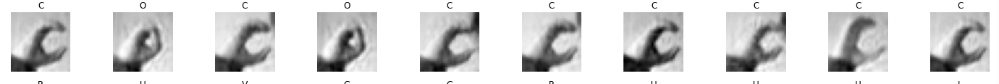

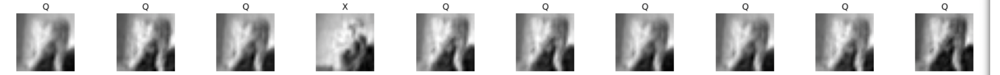

Taking 10000 samples of the training portion of fashion MNIST dataset and cluster the images using a Gaussian mixture model. 

In [356]:
from sklearn.mixture import GaussianMixture
gm_models = [GaussianMixture(n_components=i, n_init=1, random_state=4200).fit(x_rand_pca) for i in k]
aic = [gm.aic(x_rand_pca) for gm in gm_models]
bic = [gm.bic(x_rand_pca) for gm in gm_models]

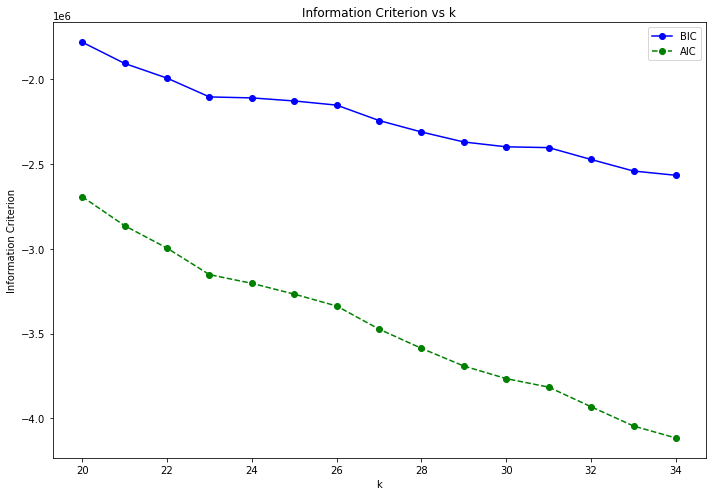

In [357]:
fig = plt.figure(figsize=(10,7))
plt.plot(k, bic, 'bo-', label='BIC')
plt.plot(k, aic, 'go--', label='AIC')
plt.title('Information Criterion vs k')
plt.xlabel('k')
plt.ylabel('Information Criterion')
plt.legend()
plt.tight_layout()
plt.show()

- From the above graph we can see that the lowest AIC and BIC score we are getting is for 34 clusters. So we will choose appropriate number of 34 for the clusters

In [358]:
gm = gm_models[-1]# for selecting the 34th cluster from the array
y_val_pred = gm.predict(x_val_pca)

 Visualizing the clusters 

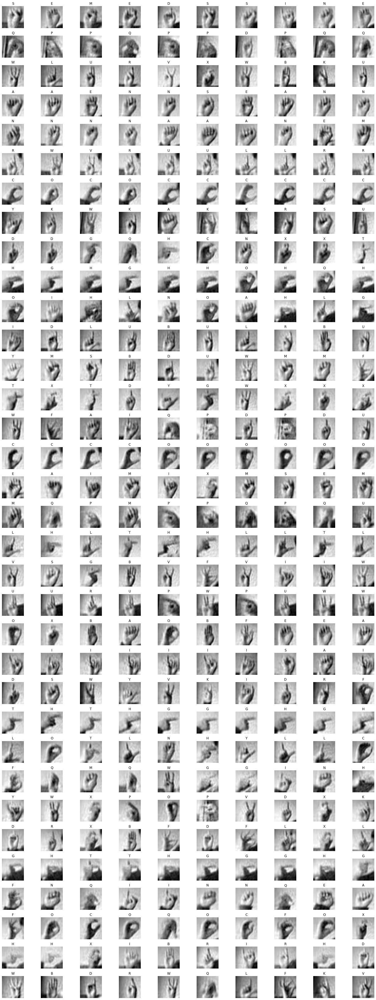

In [362]:
fig = plt.figure(figsize=(20,50))

for i in range(34):
    i_labelled_imgs = pca.inverse_transform(x_val_pca[y_val_pred == i][:10])
    true_labels = y_val[y_val_pred == i][:10]

    for j in range(10):
        plt.subplot(34,10, i*10 + j + 1)
        plt.imshow(i_labelled_imgs[j].reshape(28,28), cmap='gray')
        plt.title(classes[true_labels.iloc[j]])
        plt.axis('off')

plt.tight_layout()
plt.show()

- For the same reason as for K means there appears to be an overlap between the clusters and the images are not being perfeclty categorized into each of the clusters because there is very little variation in the signs of the image. The images look so much alike that it is not able to categorize well.

- For example lets look the images in the first cluster.The images look almost the same with little variation to categorize them with different labels.

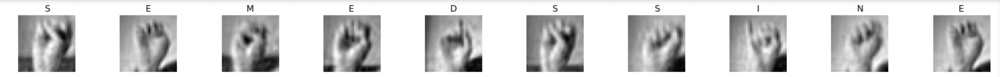

- As an example some of the characters like A,N and E look almost similar, so it has formed similar clusters for them. There is only a difference of a thumb placement which is differentiating these characters which our Gaussian model is not able to perfectly capture

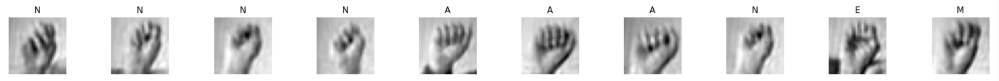

- However C and 0 which look a quite alike are able to get categorized into similar clusters.
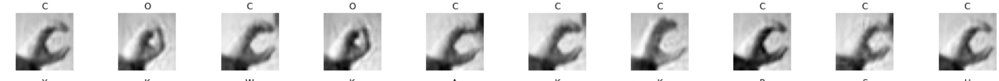

- Another example is of character I being categorized well because it is much differnent from other characters.
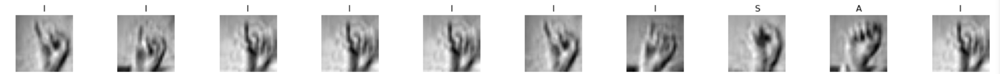

 Using the model to generate 20 new clothing items (using thesample() method), and visualize them (since you used PCA, you will need to use its inverse_transform() method)

In [363]:
x_gen, y_gen = gm.sample(20)

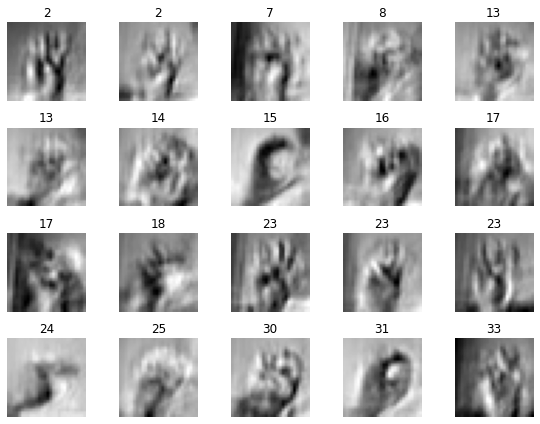

In [364]:
fig = plt.figure(figsize=(8,6))

for i in range(20):
    img = pca.inverse_transform(x_gen[i]).reshape(28,28)
    plt.subplot(4,5,i+1)
    plt.imshow(img, cmap='gray')
    plt.title(y_gen[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

- Note that we are using pca transformed images in our gaussian model in which there was already information loss.
- Now we are reconstructing those images so that they look close to our PCA transformed images
- These are the reconstructed images using pca_inverse transform but as we can see that the images are not perfectly reconstructed/blurred as there was information loss while doing PCA. Thery are close to the PCA transformed images which we expected.

### Deep Learning

In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE, LocallyLinearEmbedding, MDS
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, silhouette_samples
import tensorflow as tf
from tensorflow import keras
from matplotlib import pyplot as plt
from matplotlib import cm as cm
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
from tqdm import tqdm
import warnings

In [2]:
test = pd.read_csv('sign_mnist_test.csv')
train = pd.read_csv('sign_mnist_train.csv')

In [3]:
classes = {0: "A", 1: "B", 2: "C", 3: "D", 4: "E", 5: "F", 6: "G", 7: "H", 8: "I", 9: "J", 10: "K", 11: "L", 12: "M", 13: "N", 14: "O", 15: "P", 16: "Q", 17: "R", 18: "S", 19: "T", 20: "U", 21: "V", 22: "W", 23: "X", 24: "Y", 25: "Z"}


In [4]:
train, val = train_test_split(train, test_size=4000, random_state=42, stratify=train['label'])

In [5]:
x_train, y_train = train.drop('label', axis=1) / 255, train['label']
x_val, y_val = val.drop('label', axis=1) / 255, val['label']
x_test, y_test = test.drop('label', axis=1) / 255, test['label']

 Building a fully connected (dense) feedforward neural network with two hidden layers using Keras(within Tensorflow)  First hidden layer shouldcontain 200 neurons and second hidden layer should contain 50 neurons. The hidden layers shouldhave ReLU activation function. Training the network for 100 epochs. Plotting training and validation lossand accuracy as a function of training epochs. Trying three different learning rates of your choice (make the plots for each learning rate)

In [6]:
pca = PCA(n_components=0.95) # For 95% of the total variance to remain in our train dataset
x_train_pca = pca.fit_transform(x_train)

In [ ]:
model_relu = keras.models.Sequential([
    keras.layers.Input(shape=(784,)),
    keras.layers.Dense(200, activation="relu"), # First Layer with 200 neurons
    keras.layers.Dense(50, activation="relu"),# Second Layer with 50 neurons
    keras.layers.Dense(25, activation="softmax")
])

In [ ]:
model_relu.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 200)               157000    
                                                                 
 dense_7 (Dense)             (None, 50)                10050     
                                                                 
 dense_8 (Dense)             (None, 25)                1275      
                                                                 
Total params: 168,325
Trainable params: 168,325
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_relu.compile(loss='sparse_categorical_crossentropy',
                   optimizer='sgd',
                   metrics=['accuracy'])

### Running for 100 epochs

In [ ]:
history_relu = model_relu.fit(x_train, y_train, epochs=100, validation_data=(x_val, y_val))

Epoch 1/100
733/733 [==============================] - 4s 5ms/step - loss: 2.8464 - accuracy: 0.2009 - val_loss: 2.3652 - val_accuracy: 0.3162
Epoch 2/100
733/733 [==============================] - 3s 3ms/step - loss: 1.9967 - accuracy: 0.4079 - val_loss: 1.6993 - val_accuracy: 0.4980
Epoch 3/100
733/733 [==============================] - 2s 3ms/step - loss: 1.5488 - accuracy: 0.5278 - val_loss: 1.4371 - val_accuracy: 0.5615
Epoch 4/100
733/733 [==============================] - 2s 3ms/step - loss: 1.2792 - accuracy: 0.6105 - val_loss: 1.2628 - val_accuracy: 0.5975
Epoch 5/100
733/733 [==============================] - 3s 4ms/step - loss: 1.0829 - accuracy: 0.6753 - val_loss: 1.0198 - val_accuracy: 0.6750
Epoch 6/100
733/733 [==============================] - 3s 4ms/step - loss: 0.9228 - accuracy: 0.7212 - val_loss: 0.8175 - val_accuracy: 0.7477
Epoch 7/100
733/733 [==============================] - 2s 3ms/step - loss: 0.8096 - accuracy: 0.7562 - val_loss: 0.8305 - val_accuracy: 0.7368

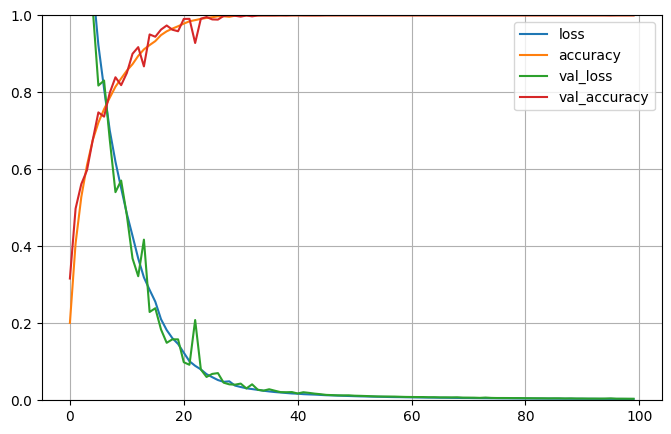

In [ ]:
pd.DataFrame(history_relu.history).plot(figsize=(8,5))
plt.grid(True)
plt.gca().set_ylim(0,1)
plt.show()

- We see that our training loss is following validation loss and our model is converged within 40 epochs  only 

#### Trying different Learning Rates

In [ ]:
learning_rates = [0.00001, 0.0001, 0.0005]

dnn_models_relu = [
    keras.models.Sequential([
    keras.layers.Input(shape=(784,)),
    keras.layers.Dense(200, activation="relu"),
    keras.layers.Dense(50, activation="relu"),
    keras.layers.Dense(25, activation="softmax")
]) for lr in learning_rates]

hist_relu = []

for i in range(len(learning_rates)):
    dnn_models_relu[i].compile(loss='sparse_categorical_crossentropy',
                               optimizer=keras.optimizers.SGD(lr=learning_rates[i]),
                               metrics=['accuracy'])

    hist_relu.append(dnn_models_relu[i].fit(x_train, y_train, epochs=100, verbose=0, validation_data=(x_val, y_val)))

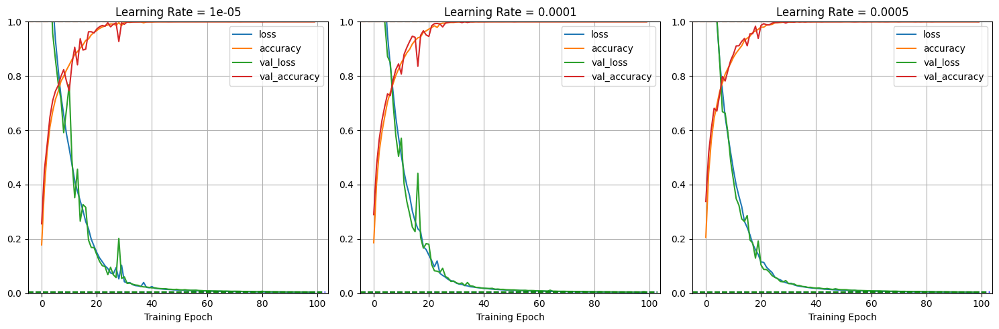

In [ ]:
fig = plt.figure(figsize=(15,5))

for i in range(3):
    ax = plt.subplot(1,3,i+1)
    pd.DataFrame(hist_relu[i].history).plot(ax=ax)
    ax.axhline(y=min(hist_relu[i].history['loss']), xmin=0, 
                xmax=np.argmin(hist_relu[i].history['loss'])/100, color='b', linestyle='--')
    ax.axhline(y=max(hist_relu[i].history['accuracy']), xmin=0, 
                xmax=np.argmax(hist_relu[i].history['accuracy'])/100, color='orange', linestyle='--')
    ax.axhline(y=min(hist_relu[i].history['val_loss']), xmin=0, 
                xmax=np.argmin(hist_relu[i].history['val_loss'])/100, color='g', linestyle='--')
    ax.axhline(y=max(hist_relu[i].history['val_accuracy']), xmin=0, 
                xmax=np.argmax(hist_relu[i].history['val_accuracy'])/100, color='r', linestyle='--')
    plt.title(f'Learning Rate = {learning_rates[i]}')
    plt.grid(True)
    ax.set_ylim(0,1)
    plt.xlabel('Training Epoch')
    
plt.legend()
plt.tight_layout()
plt.show()

- From the above graphs Irrespective of learning rate, the model is able to detect the relationship between features of data by 40 epochs and all 3 learning rates give almost same convergence so we can select any one of them.

- For each of the learning rates dnn perform pretty well on the validation data and converges by 40 epochs only which means that is able the figure out the complex relationship in the dataset pretty well

 Running the network on the test portion of the dataset using best-performing learning rate and report loss and accuracy.

#### I am using best model with the learning rate of 0.0005

In [ ]:
best_model_relu = dnn_models_relu[2]
best_model_relu.evaluate(x_test, y_test)

225/225 [==============================] - 1s 3ms/step - loss: 1.4470 - accuracy: 0.7401


[1.4470412731170654, 0.7401003837585449]

 How many parameters does the network have? How many of those parameters are bias parameters?

In [ ]:
best_model_relu.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_21 (Dense)            (None, 200)               157000    
                                                                 
 dense_22 (Dense)            (None, 50)                10050     
                                                                 
 dense_23 (Dense)            (None, 25)                1275      
                                                                 
Total params: 168,325
Trainable params: 168,325
Non-trainable params: 0
_________________________________________________________________


- The total number of parameters are 168,325 and the number of bias parameters are 275 and the remaining weight parameters  are 168,050

 Repeating everything from the previous step but make the hidden layers have linear activation functions. 

In [7]:
model_lin = keras.models.Sequential([
    keras.layers.Input(shape=(784,)),
    keras.layers.Dense(200),
    keras.layers.Dense(50),
    keras.layers.Dense(25, activation="softmax")
])

In [8]:
model_lin.compile(loss='sparse_categorical_crossentropy',
                  optimizer='sgd',
                  metrics=['accuracy'])

In [9]:
history_lin = model_lin.fit(x_train, y_train, epochs=100, validation_data=(x_val, y_val))

Epoch 1/100
733/733 [==============================] - 5s 5ms/step - loss: 2.4007 - accuracy: 0.3154 - val_loss: 1.7865 - val_accuracy: 0.4955
Epoch 2/100
733/733 [==============================] - 3s 4ms/step - loss: 1.4943 - accuracy: 0.5735 - val_loss: 1.2766 - val_accuracy: 0.6345
Epoch 3/100
733/733 [==============================] - 3s 4ms/step - loss: 1.1459 - accuracy: 0.6596 - val_loss: 1.1441 - val_accuracy: 0.6435
Epoch 4/100
733/733 [==============================] - 3s 4ms/step - loss: 0.9588 - accuracy: 0.7149 - val_loss: 0.8894 - val_accuracy: 0.7402
Epoch 5/100
733/733 [==============================] - 4s 5ms/step - loss: 0.8371 - accuracy: 0.7462 - val_loss: 0.7813 - val_accuracy: 0.7582
Epoch 6/100
733/733 [==============================] - 3s 4ms/step - loss: 0.7329 - accuracy: 0.7796 - val_loss: 0.7325 - val_accuracy: 0.7790
Epoch 7/100
733/733 [==============================] - 3s 4ms/step - loss: 0.6564 - accuracy: 0.8041 - val_loss: 0.6073 - val_accuracy: 0.8180

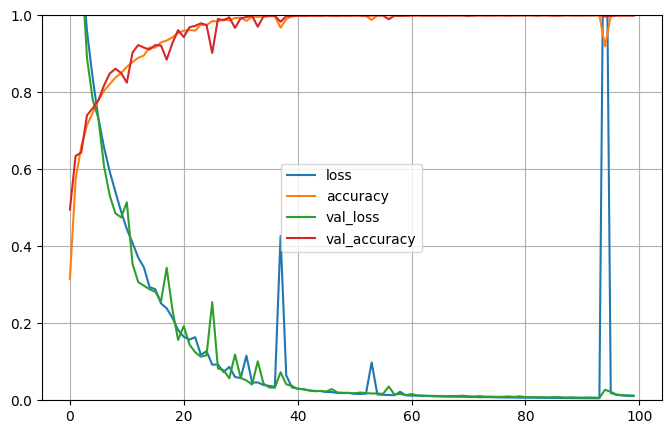

In [10]:
pd.DataFrame(history_lin.history).plot(figsize=(8,5))
plt.grid(True)
plt.gca().set_ylim(0,1)
plt.show()

- Using different Learning rates here

In [11]:
learning_rates = [0.00001, 0.0001, 0.0005]
dnn_models_lin = [
    keras.models.Sequential([
    keras.layers.Input(shape=(784,)),
    keras.layers.Dense(200),
    keras.layers.Dense(50),
    keras.layers.Dense(25, activation="softmax")
]) for lr in learning_rates]

hist_lin = []

for i in range(len(learning_rates)):
    dnn_models_lin[i].compile(loss='sparse_categorical_crossentropy',
                              optimizer=keras.optimizers.SGD(lr=learning_rates[i]),
                              metrics=['accuracy'])

    hist_lin.append(dnn_models_lin[i].fit(x_train, y_train, epochs=100, verbose=0, validation_data=(x_val, y_val)))

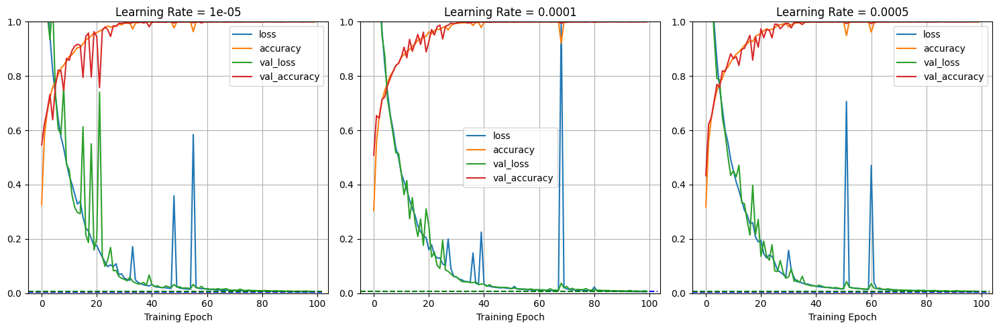

In [12]:
fig = plt.figure(figsize=(15,5))

for i in range(3):
    ax = plt.subplot(1,3,i+1)
    pd.DataFrame(hist_lin[i].history).plot(ax=ax)
    ax.axhline(y=min(hist_lin[i].history['loss']), xmin=0, 
                xmax=np.argmin(hist_lin[i].history['loss'])/100, color='b', linestyle='--')
    ax.axhline(y=max(hist_lin[i].history['accuracy']), xmin=0, 
                xmax=np.argmax(hist_lin[i].history['accuracy'])/100, color='orange', linestyle='--')
    ax.axhline(y=min(hist_lin[i].history['val_loss']), xmin=0, 
                xmax=np.argmin(hist_lin[i].history['val_loss'])/100, color='g', linestyle='--')
    ax.axhline(y=max(hist_lin[i].history['val_accuracy']), xmin=0, 
                xmax=np.argmax(hist_lin[i].history['val_accuracy'])/100, color='r', linestyle='--')
    plt.title(f'Learning Rate = {learning_rates[i]}')
    plt.grid(True)
    ax.set_ylim(0,1)
    plt.xlabel('Training Epoch')
    
plt.legend()
plt.tight_layout()
plt.show()

Here, Also
- From the above graphs Irrespective of learning rate, the model is able to detect the relationship between features of data by 40 epochs and all 3 learning rates give almost same convergence so we can select any one of them.

- For each of the learning rates dnn perform pretty well on the validation data and converges by 40 epochs only which means that is able the figure out the complex relationship in the dataset pretty well

In [17]:
best_model_lin = dnn_models_lin[2]
best_model_lin.evaluate(x_test, y_test)

225/225 [==============================] - 1s 3ms/step - loss: 1.9016 - accuracy: 0.6928


[1.9015923738479614, 0.6928332448005676]

In [ ]:
best_model_lin.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_39 (Dense)            (None, 200)               157000    
                                                                 
 dense_40 (Dense)            (None, 50)                10050     
                                                                 
 dense_41 (Dense)            (None, 25)                1275      
                                                                 
Total params: 168,325
Trainable params: 168,325
Non-trainable params: 0
_________________________________________________________________


- The total number of parameters are 168,325 and the number of bias parameters are 275 and the remaining weight parameters  are 168,050

 Discussing how this impacts accuracy and why?

- When using Relu activation function we were getting accuracy of 74% and with Linear activation function we are getting the accuracy of 69%


-  The accuracy on the test set while using linear activation function decreases because with linear activation function, the output of last hidden layer is basically a linear transformation of inputs, so the model is only capturing the linear relationship of the data, but in the case of non-linear activation funciton like relu the model is able to capture the complex non-linear relationships which results in better performance on the test data with a higher accuracy

#### Refrences 

- Aurlien Gron. 2017. Hands-On Machine Learning with Scikit-Learn and TensorFlow: Concepts, Tools, and Techniques to Build Intelligent Systems (1st. ed.). O'Reilly Media, Inc


- https://scikit-learn.org/stable/

- https://matplotlib.org/stable/users/index.html
